# Toronto Dwellings Analysis

In this assignment, you will perform fundamental analysis for the Toronto dwellings market to allow potential real estate investors to choose rental investment properties.

In [1]:
# Import Relevant Libraries

import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import os
from pathlib import Path
from dotenv import load_dotenv

In [2]:
# Read the Mapbox API key

load_dotenv()
map_box_api = os.getenv("mapbox")

## Load Data

In [3]:
# Read the census data into a Pandas DataFrame

file_path = Path("Data/toronto_neighbourhoods_census_data.csv")
to_data = pd.read_csv(file_path, index_col="year")
to_data.head()

,neighbourhood,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house,average_house_value,shelter_costs_owned,shelter_costs_rented
year,,,,,,,,,,,,
2001,Agincourt North,3715,1480,0,1055,1295,195,185,5,200388,810,870
2001,Agincourt South-Malvern West,3250,1835,0,545,455,105,425,0,203047,806,892
2001,Alderwood,3175,315,0,470,50,185,370,0,259998,817,924
2001,Annex,1060,6090,5,1980,605,275,3710,165,453850,1027,1378
2001,Banbury-Don Mills,3615,4465,0,240,380,15,1360,0,371864,1007,1163


- - - 

## Dwelling Types Per Year

In this section, you will calculate the number of dwelling types per year. Visualize the results using bar charts and the Pandas plot function. 

**Hint:** Use the Pandas `groupby` function.

**Optional challenge:** Plot each bar chart in a different color.

In [4]:
# Calculate the sum number of dwelling types units per year (hint: use groupby)

dwelling_type_df = to_data[['single_detached_house', 'apartment_five_storeys_plus',
       'movable_dwelling', 'semi_detached_house', 'row_house', 'duplex',
       'apartment_five_storeys_less', 'other_house']]

In [5]:
# Group by year and sum totals

dwelling_type_df = dwelling_type_df.groupby("year").sum()

In [7]:
# Display grouped dataframe

dwelling_type_df.head()

,single_detached_house,apartment_five_storeys_plus,movable_dwelling,semi_detached_house,row_house,duplex,apartment_five_storeys_less,other_house
year,,,,,,,,
2001,300930,355015,75,90995,52355,23785,116900,3040
2006,266860,379400,165,69430,54690,44095,162850,1335
2011,274940,429220,100,72480,60355,44750,163895,2165
2016,269680,493270,95,71200,61565,48585,165575,2845


In [8]:
# Save the dataframe as a csv file

dwelling_type_df.to_csv("Data/dwelling_type_df.csv")

In [9]:
# Grab data from 2001 (all columns)

dwelling_type_df.loc[2001,:]

single_detached_house          300930
apartment_five_storeys_plus    355015
movable_dwelling                   75
semi_detached_house             90995
row_house                       52355
duplex                          23785
apartment_five_storeys_less    116900
other_house                      3040
Name: 2001, dtype: int64

In [10]:
# Helper create_bar_chart function

def create_bar_chart(data, title, xlabel, ylabel, color):
    bar_chart = data.hvplot.bar(
    title=title,
    xlabel=xlabel,
    ylabel=ylabel,
    color=color,
    height=600,
    width=800,
    rot=90).opts(yformatter="%.0f")
    return bar_chart
        
    
  
    

In [11]:
# Create a bar chart per year to show the number of dwelling types

# Bar chart for 2001

create_bar_chart(dwelling_type_df.loc[2001,:], "Dwelling Types in Toronto in 2001","2001","Dwelling Type Units","red")

:Bars   [index]   (2001)

In [12]:
# Bar chart for 2006

create_bar_chart(dwelling_type_df.loc[2006,:], "Dwelling Types in Toronto in 2006", "2006", "Dwelling Type Units", "blue")

:Bars   [index]   (2006)

In [13]:
# Bar chart for 2011

create_bar_chart(dwelling_type_df.loc[2011,:], "Dwelling Types in Toronto in 2011", "2011", "Dwelling Type Units", "yellow")

:Bars   [index]   (2011)

In [14]:
# Bar chart for 2016

create_bar_chart(dwelling_type_df.loc[2016,:], "Dwelling Types in Toronto in 2016", "2016", "Dwelling Type Units", "pink")

:Bars   [index]   (2016)

- - - 

## Average Monthly Shelter Costs in Toronto Per Year

In this section, you will calculate the average monthly shelter costs for owned and rented dwellings and the average house value for each year. Plot the results as a line chart.

**Optional challenge:** Plot each line chart in a different color.

In [15]:
# Calculate the average monthly shelter costs for owned and rented dwellings

avg_shelter_costs = to_data[["shelter_costs_owned", "shelter_costs_rented"]].groupby("year").mean()
avg_shelter_costs.head()

,shelter_costs_owned,shelter_costs_rented
year,,
2001,846.878571,1085.935714
2006,1316.800000,925.414286
2011,1448.214286,1019.792857
2016,1761.314286,1256.321429


In [16]:
# Helper create_line_chart function

def create_line_chart(data, title, xlabel, ylabel, color):
    line_chart = data.hvplot.line(
    title=title,
    xlabel=xlabel,
    ylabel=ylabel,
    color=color,
    height=600,
    width=800,
    rot=90)
    return line_chart

In [17]:
# Create two line charts, one to plot the monthly shelter costs for owned dwelleing and other for rented dwellings per year

# Line chart for owned dwellings

create_line_chart(avg_shelter_costs.loc[:,"shelter_costs_owned"], "Average Monthly Shelter Costs for Owned Dwellings in Toronto", "Year", "Avg Monthly Shelter Costs", "purple")

:Curve   [year]   (shelter_costs_owned)

In [18]:
# Line chart for rented dwellings

create_line_chart(avg_shelter_costs.loc[:, "shelter_costs_rented"], "Average Monthly Shelter Costs for Rented Dwellings in Toronto", "Year", "Avg Monthly Shelter Costs", "green")

:Curve   [year]   (shelter_costs_rented)

## Average House Value per Year

In this section, you want to determine the average house value per year. An investor may want to understand better the sales price of the rental property over time. For example, a customer will want to know if they should expect an increase or decrease in the property value over time so they can determine how long to hold the rental property. You will visualize the `average_house_value` per year as a bar chart.

In [19]:
# Calculate the average house value per year

avg_house_value = to_data["average_house_value"].groupby("year").mean()
avg_house_value

year
2001    289882.885714
2006    424059.664286
2011    530424.721429
2016    664068.328571
Name: average_house_value, dtype: float64

In [20]:
# Plot the average house value per year as a line chart

avg_house_value.hvplot.line(title="Average House Value in Toronto", xlabel="Year", ylabel="Avg House Value", color="orange").opts(yformatter="%0.0f")

:Curve   [year]   (average_house_value)

- - - 

## Average House Value by Neighbourhood

In this section, you will use `hvplot` to create an interactive visualization of the average house value with a dropdown selector for the neighbourhood.

**Hint:** It will be easier to create a new DataFrame from grouping the data and calculating the mean house values for each year and neighbourhood.

In [21]:
# Create a new DataFrame with the mean house values by neighbourhood per year

avg_value_neighbrhd = to_data[["neighbourhood", "average_house_value"]]
avg_value_neighbrhd = avg_value_neighbrhd.groupby([avg_value_neighbrhd.index, "neighbourhood"]).mean()
avg_value_neighbrhd.reset_index(inplace=True)
avg_value_neighbrhd.head()

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388
1,2001,Agincourt South-Malvern West,203047
2,2001,Alderwood,259998
3,2001,Annex,453850
4,2001,Banbury-Don Mills,371864


In [25]:
# Use hvplot to create an interactive line chart of the average house value per neighbourhood
# Dropdown selector for the neighbourhood included

avg_value_neighbrhd.hvplot.line("year", "average_house_value", xlabel="Year", ylabel="Avg Home Value", color="red", groupby="neighbourhood")





:DynamicMap   [neighbourhood]
   :Curve   [year]   (average_house_value)

## Number of Dwelling Types per Year

In this section, you will use `hvplot` to create an interactive visualization of the average number of dwelling types per year with a dropdown selector for the neighbourhood.

In [26]:
# Fetch the data of all dwelling types per year

number_dwellings_df = to_data.drop(columns=["average_house_value", "shelter_costs_owned", "shelter_costs_rented"])
number_dwellings_df = number_dwellings_df.groupby([number_dwellings_df.index, "neighbourhood"]).sum()
number_dwellings_df.head()

single_detached_house  \
year neighbourhood                                         
2001 Agincourt North                                3715   
     Agincourt South-Malvern West                   3250   
     Alderwood                                      3175   
     Annex                                          1060   
     Banbury-Don Mills                              3615   

                                   apartment_five_storeys_plus  \
year neighbourhood                                               
2001 Agincourt North                                      1480   
     Agincourt South-Malvern West                         1835   
     Alderwood                                             315   
     Annex                                                6090   
     Banbury-Don Mills                                    4465   

                                   movable_dwelling  semi_detached_house  \
year neighbourhood                                                         
2001 Agincourt North                              0                 1055   
     Agincourt South-Malvern West                 0                  545   
     Alderwood                                    0                  470   
     Annex                                        5                 1980   
     Banbury-Don Mills                            0                  240   

                                   row_house  duplex  \
year neighbourhood                                     
2001 Agincourt North                    1295     195   
     Agincourt South-Malvern West        455     105   
     Alderwood                            50     185   
     Annex                               605     275   
     Banbury-Don Mills                   380      15   

                                   apartment_five_storeys_less  other_house  
year neighbourhood                                                           
2001 Agincourt North                                       185            5  
     Agincourt South-Malvern West                          425            0  
     Alderwood                                             370            0  
     Annex                                                3710          165  
     Banbury-Don Mills                                    1360            0

In [27]:
# Use hvplot to create an interactive bar chart of the number of dwelling types per neighbourhood

number_dwellings_df.hvplot.bar("year", xlabel="Year", ylabel="Dwelling Type Units", rot=90, groupby="neighbourhood", height=800, width=800)

:DynamicMap   [neighbourhood]
   :Bars   [year,Variable]   (value)

- - - 

## The Top 10 Most Expensive Neighbourhoods

In this section, you will need to calculate the house value for each neighbourhood and then sort the values to obtain the top 10 most expensive neighbourhoods on average. Plot the results as a bar chart.

In [28]:
# Getting the data from the top 10 expensive neighbourhoods

top_10_expensive = to_data.loc[:,["neighbourhood", "average_house_value"]]
top_10_expensive = top_10_expensive.groupby("neighbourhood").mean()
top_10_expensive = top_10_expensive.nlargest(10, "average_house_value")
top_10_expensive.head()

,average_house_value
neighbourhood,
Bridle Path-Sunnybrook-York Mills,1526485.75
Forest Hill South,1195992.50
Lawrence Park South,1094027.75
Rosedale-Moore Park,1093640.00
St.Andrew-Windfields,999107.00


In [29]:
# Plotting the data from the top 10 expensive neighbourhoods

top_10_expensive.hvplot.bar(xlabel="Year", ylabel="Avg House Value", rot=90, title="Top 10 Most Expensive Neighbourhoods in Toronto", width=800, height=800).opts(hover_line_color="red", yformatter="%0.0f")

:Bars   [neighbourhood]   (average_house_value)

- - - 

## Neighbourhood Map

In this section, you will read in neighbourhoods location data and build an interactive map with the average house value per neighbourhood. Use a `scatter_mapbox` from Plotly express to create the visualization. Remember, you will need your Mapbox API key for this.

### Load Location Data

In [30]:
# Load neighbourhoods coordinates data

file_path = Path("Data/toronto_neighbourhoods_coordinates.csv")
df_neighbourhood_locations = pd.read_csv(file_path)
df_neighbourhood_locations.head(10)


,neighbourhood,lat,lon
0,Agincourt North,43.805441,-79.266712
1,Agincourt South-Malvern West,43.788658,-79.265612
2,Alderwood,43.604937,-79.541611
3,Annex,43.671585,-79.404001
4,Banbury-Don Mills,43.737657,-79.349718
5,Bathurst Manor,43.764813,-79.456055
6,Bay Street Corridor,43.657511,-79.385721
7,Bayview Village,43.776361,-79.377117
8,Bayview Woods-Steeles,43.796802,-79.382118
9,Bedford Park-Nortown,43.731486,-79.420227


### Data Preparation

You will need to join the location data with the mean values per neighbourhood.

1. Calculate the mean values for each neighbourhood.

2. Join the average values with the neighbourhood locations.

In [31]:
# Calculate the mean values for each neighborhood

avg_house_value = to_data.loc[:,["neighbourhood", "average_house_value"]]
avg_house_value = avg_house_value.groupby("neighbourhood").mean()
avg_house_value.reset_index(inplace=True)
avg_house_value.head()

,neighbourhood,average_house_value
0,Agincourt North,329811.5
1,Agincourt South-Malvern West,334189.0
2,Alderwood,427922.5
3,Annex,746977.0
4,Banbury-Don Mills,612039.0


In [32]:
# Join the average values with the neighbourhood locations

combined_df = pd.concat([avg_house_value, df_neighbourhood_locations], axis=1)
combined_df = combined_df.loc[:, ~combined_df.columns.duplicated()]
combined_df.head()

,neighbourhood,average_house_value,lat,lon
0,Agincourt North,329811.5,43.805441,-79.266712
1,Agincourt South-Malvern West,334189.0,43.788658,-79.265612
2,Alderwood,427922.5,43.604937,-79.541611
3,Annex,746977.0,43.671585,-79.404001
4,Banbury-Don Mills,612039.0,43.737657,-79.349718


### Mapbox Visualization

Plot the average values per neighbourhood using a Plotly express `scatter_mapbox` visualization.

In [33]:
# Set the Mapbox API

px.set_mapbox_access_token(map_box_api)

In [34]:
# Create a scatter mapbox to analyze neighbourhood info

mapbox_viz = px.scatter_mapbox(
    combined_df,
    lat="lat",
    lon="lon",
    color="average_house_value",
    size="average_house_value",
    hover_name="neighbourhood"
    
)

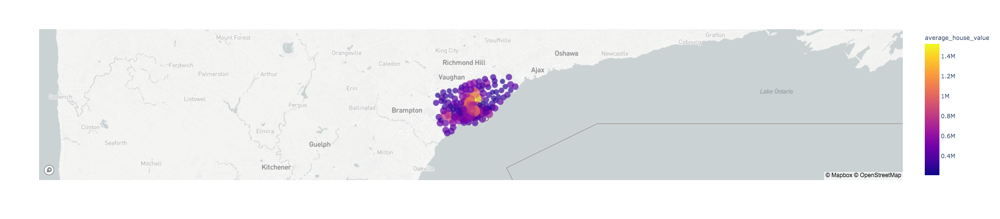

In [35]:
mapbox_viz.show()

- - -

## Cost Analysis - Optional Challenge

In this section, you will use Plotly express to a couple of plots that investors can interactively filter and explore various factors related to the house value of the Toronto's neighbourhoods. 

### Create a bar chart row facet to plot the average house values for all Toronto's neighbourhoods per year

In [36]:
# Grab data to be used for facet plot

facet_plot = to_data.loc[:,["neighbourhood", "average_house_value"]]
facet_plot = facet_plot.groupby([facet_plot.index, "neighbourhood"]).mean()
facet_plot.reset_index(inplace=True)
facet_plot.head()

,year,neighbourhood,average_house_value
0,2001,Agincourt North,200388
1,2001,Agincourt South-Malvern West,203047
2,2001,Alderwood,259998
3,2001,Annex,453850
4,2001,Banbury-Don Mills,371864


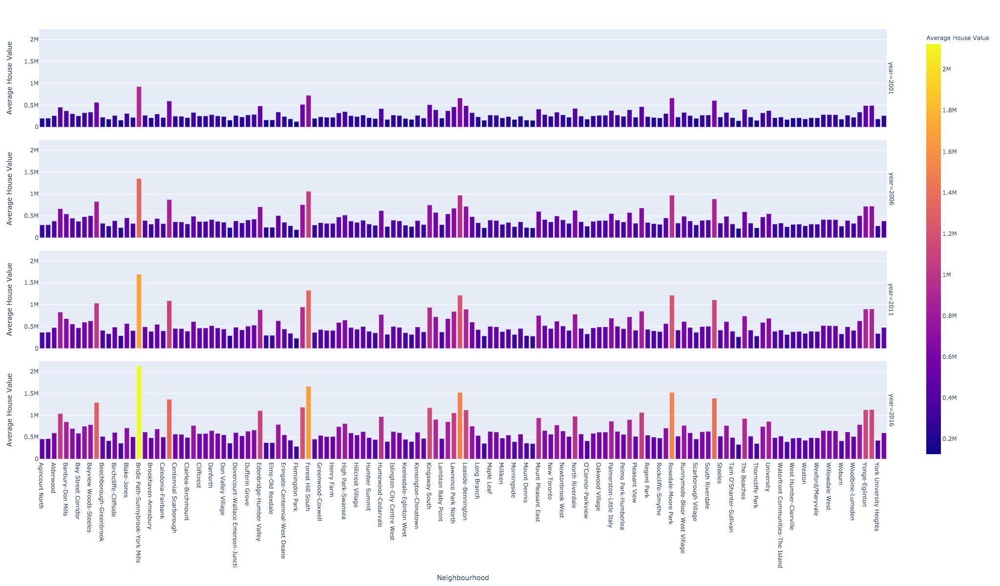

In [42]:
# Use plotly express to create plot

fig2 = px.bar(facet_plot, x="neighbourhood", y="average_house_value", color="average_house_value", facet_row="year", labels={"neighbourhood": "Neighbourhood", "average_house_value": "Average House Value"}, facet_col_spacing=0.04, width=1600, height=1200)
fig2.show()

### Create a sunburst chart to conduct a costs analysis of most expensive neighbourhoods in Toronto per year

In [43]:
# Fetch the data from all expensive neighbourhoods per year.

top_2001 = to_data.loc["2001",["neighbourhood", "average_house_value"]].nlargest(10, "average_house_value")
top_2006 = to_data.loc["2006", ["neighbourhood", "average_house_value"]].nlargest(10,"average_house_value")
top_2011 = to_data.loc["2011", ["neighbourhood", "average_house_value"]].nlargest(10, "average_house_value")
top_2016 = to_data.loc["2016", ["neighbourhood", "average_house_value"]].nlargest(10, "average_house_value")

# Concat the series above

top_combined = pd.concat([top_2001, top_2006, top_2011, top_2016], axis=0)
top_combined.reset_index(inplace=True)
top_combined.head(50)



,year,neighbourhood,average_house_value
0,2001,Bridle Path-Sunnybrook-York Mills,927466
1,2001,Forest Hill South,726664
2,2001,Lawrence Park South,664712
3,2001,Rosedale-Moore Park,664476
4,2001,St.Andrew-Windfields,607040
5,2001,Casa Loma,596077
6,2001,Bedford Park-Nortown,565304
7,2001,Forest Hill North,517466
8,2001,Kingsway South,512334
9,2001,Yonge-St.Clair,494098


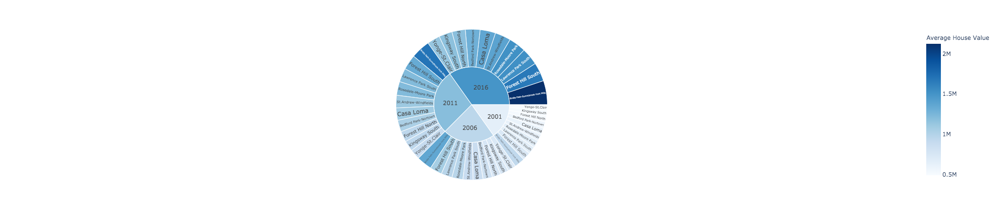

In [44]:
# Create the sunburst chart

sunburst_plot = px.sunburst(top_combined, path=["year", "neighbourhood"],
                            values="average_house_value", color="average_house_value", hover_data=["average_house_value"],
                            color_continuous_scale="blues", labels={"average_house_value": "Average House Value"})

sunburst_plot.show()